學習資源：https://www.coursera.org/learn/advanced-learning-algorithms/home/welcome

## Neural networks intuition

### 神經網路與大腦  
Neural networks:  
* 生物大腦表現出更高的智力水平，人工神經網路的動機是建構模仿大腦的軟件。
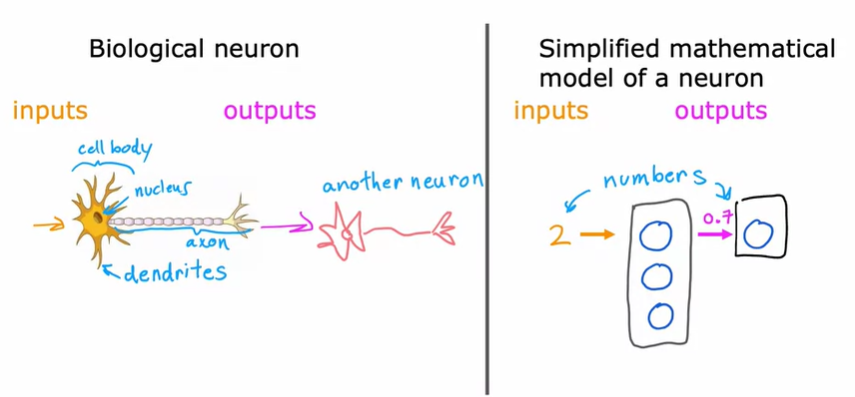


### 需求預測(Demand Prediction)  
以銷售衣服為例。  
input := x=price  output := $a=f(x)=\frac{1}{1+e^{-(wx+b)}}$  
a:=activation，神經科學中的術語，指神經元在多大程度上向下游的其他神經元發送高輸出。  
這個邏輯回歸單元可以看做是大腦中單個神經元的簡化版。神經元的作用是輸入價格x，然後它會用上方的公式計算後輸出a，a為這件衣服成為暢銷商品的概率。  
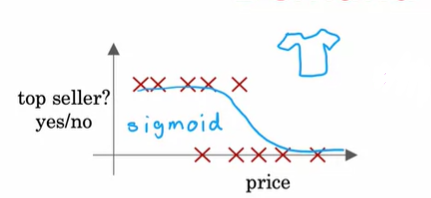  



#### probability of being a top seller  
* 實惠性
* 知名度
* 質感

層(layer)是一組神經元，以相同或相似的特徵作為輸入，接著將所有數字一起輸出。下圖共有兩層神經元，每層都可以有多個神經元。最後一層神經元稱作輸出層，輸出神經網路預測的概率。  
affordability、awareness、perceived quality、probability of being a top seller都稱為激勵值(activation)，指向下游發送的輸出值。  
輸入4個值，計算出3個新的數字，接著最後一層使用前一層輸入的三個數字去計算出一個數字，作為輸出的結果。
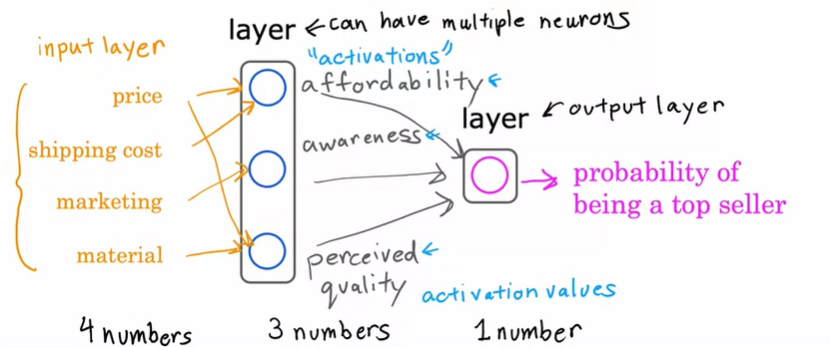  


在應用面上需要簡化上方的神經網路。  
因為當要建構大型神經網路時，無法逐一檢查神經元需要傳入哪些參數，(例如，affordability會受到價格與運費的影響，此時手動將價格與運費連向affordability，使affordability能獲取有用輸入)。  
修改成，每層中的所有神經元可以訪問前一層的所有特徵值，(例如，如果想預測affordability，並且知道所有特徵值，那需要學會忽略marketing、material，注重在與負擔能力最相關的特徵上就好)。  
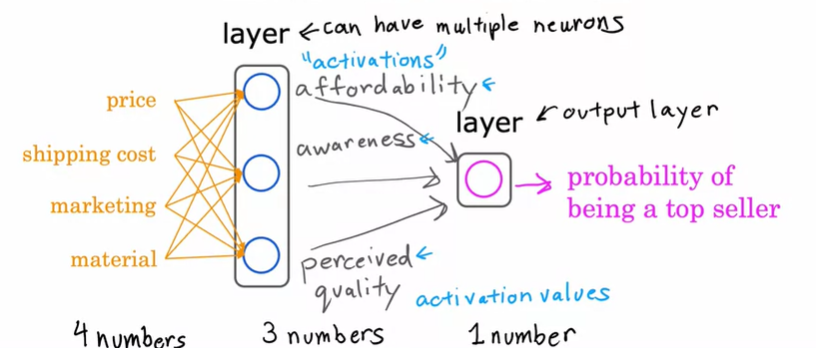

再次簡化上方的神經網路。  
將輸入的特徵組成$\vec{x}:=特徵向量$，特徵向量被送到中間層(hidden layer)，並算出3個激勵值，組成向量$\vec{a}$，送入最後的輸出層，計算後再輸出某商品成為暢銷商品的概率。  
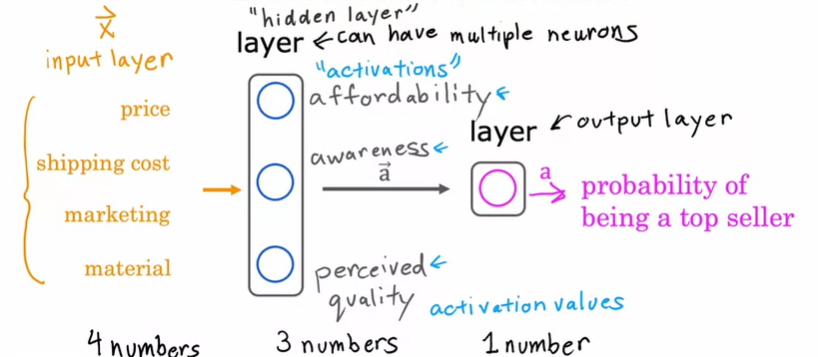

##### Multiple hidden layers  
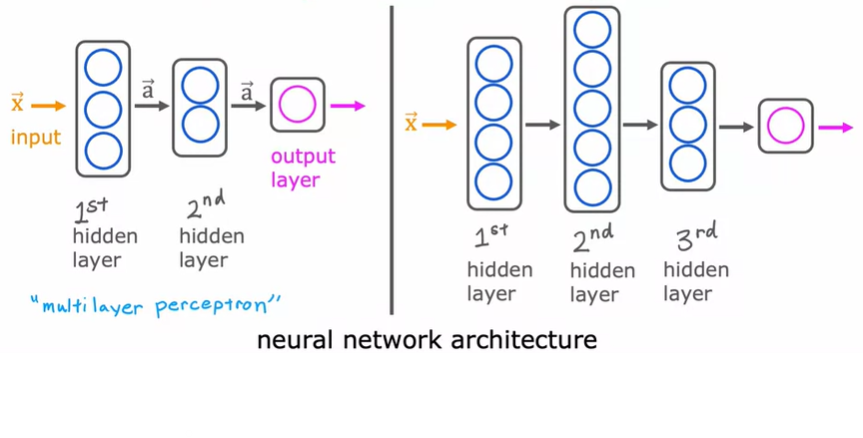

##### Example: Recognizing Images  
將像素為1000\*1000的圖片作為輸入，在電腦中呈現1000*1000的網格，每個網個中的數值都代表那個像素點的亮度，將這些像素依序排列，最終得到包含1000000個像素強度值的向量。  
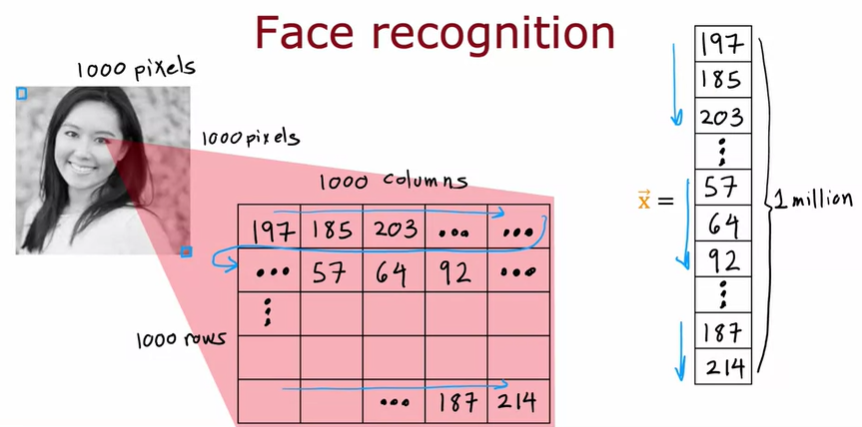  

第一層隱藏層中，神經元在圖像中尋找非常短的線條或非常短的邊緣；第二層隱藏層中，神經元在將線段組合在一起，以尋找面部的某一位置是否有眼睛；第三層隱藏層中，神經網路在聚合臉部的不同部分，嘗試檢測更大的整體面貌，接著檢測不同臉部的對應程度；輸出層嘗試確定圖片中人物的身分。  
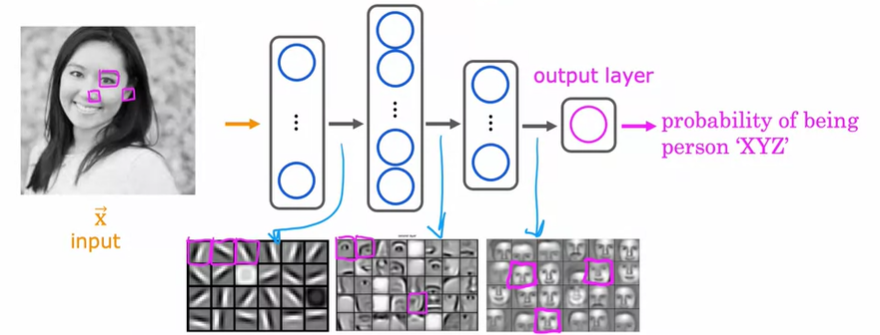

### Neural network layer  
學習如何建構一層神經元，以逐步建構大型神經網路。  
Input layer也稱作layer 0，上標$[1]$表示第一層神經網路，下標表示第一個隱藏值。傳入特徵向量$\vec{x}=\left[
\begin{array}{c}
    197 \\
    184 \\
    136 \\
    214
\end{array}
\right]$進第一層中進行運算後輸出激勵向量$\vec{a}^{[1]}=\left[
\begin{array}{c}
    0.3 \\
    0.7 \\
    0.2
\end{array}
\right]$，$g(z)$是邏輯函數。  
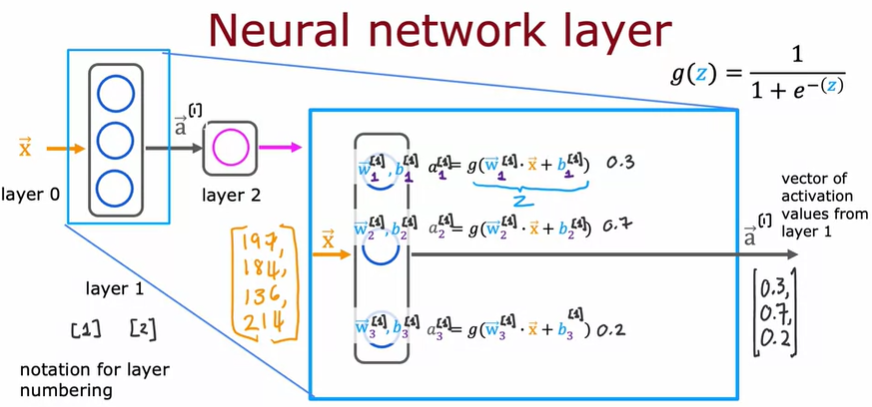  

激勵向量$\vec{a}^{[1]}=\left[
\begin{array}{c}
    0.3 \\
    0.7 \\
    0.2
\end{array}
\right]$成為layer 2的輸入，計算後假設得到0.84作為結果，因為輸出層只有一個神經元，因此這個輸出只是一個數字，而非向量，因此輸出$a^{[2]}=0.84$。
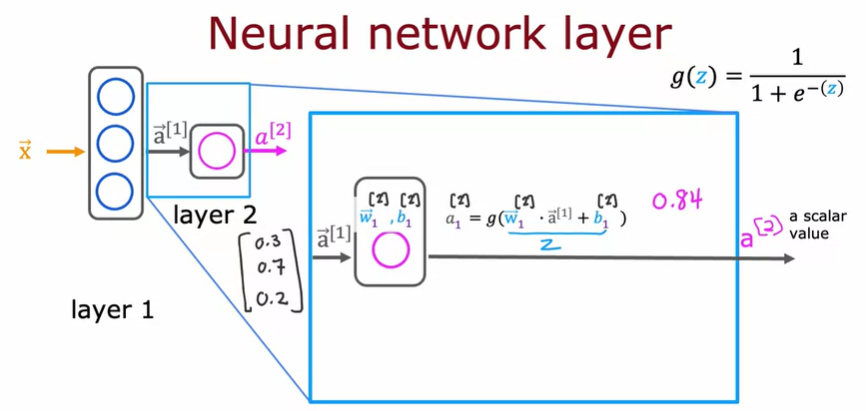  

得到0.84作為輸出，藉由選擇的閥值去分類，$\hat{y}為1或0$。  
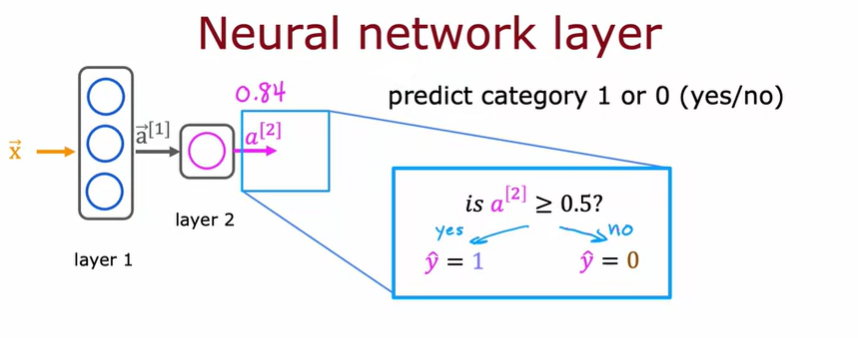  



#### 更加複雜的神經網路範例  
以下為一個四層神經網路，不包含第0層。  
$\vec{x}=\vec{a}^{[0]}$，第三層輸入$\vec{a}^{[2]}$，經過運算後的輸出值是$\vec{a}^{[3]}=\left[
\begin{array}{c}
    a_1 \\
    a_2 \\
    a_3
\end{array}
\right]$  
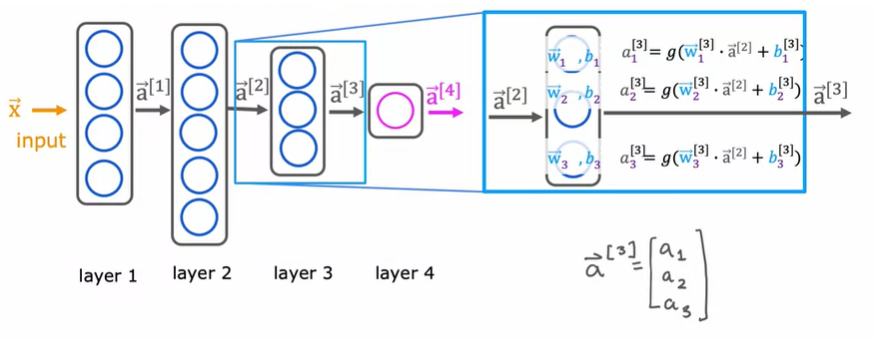  
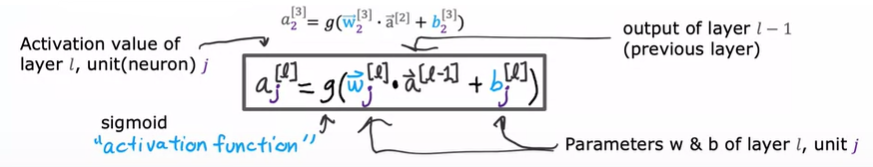

### Inference: making predictions (正向傳播，forward propagation)  
#### Handwritten digit recognition  

有兩個隱藏層的神經網路，加上輸出層，共三層。  
第一個隱藏層有25個神經元，第二個隱藏層有15個神經元，第三層，輸出層有1個神經元，輸出辨識結果是1的可能性有多大?  
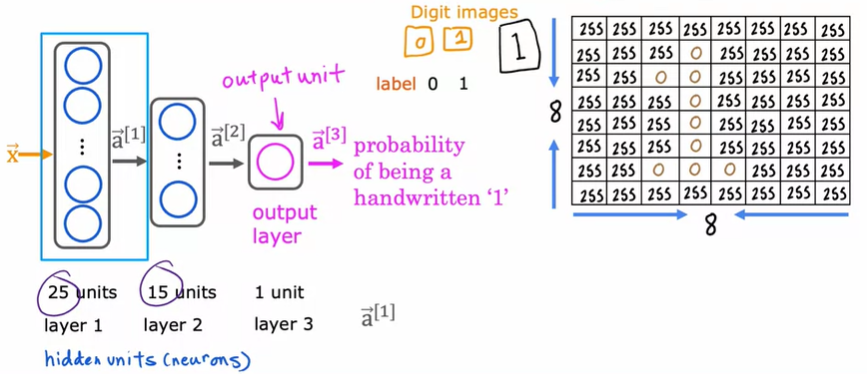  
第一層計算$\vec{x}→\vec{a}^{[1]}$，$\vec{a}^{[1]}=\left[
\begin{array}{c}
    g(\vec{w_1}^{[1]}．\vec{x}+b_1^{[1]}) \\
    ⋮ \\
    g(\vec{w_{25}}^{[1]}．\vec{x}+b_{25}^{[1]})
\end{array}
\right]=\left[
\begin{array}{c}
    g(\vec{w_1}^{[1]}．\vec{a^{[0]}}+b_1^{[1]}) \\
    ⋮ \\
    g(\vec{w_{25}}^{[1]}．\vec{a^{[0]}}+b_{25}^{[1]})
\end{array}
\right]$  
第二層計算$\vec{a}^{[1]}→\vec{a}^{[2]}$，$\vec{a}^{[2]}=\left[
\begin{array}{c}
    g(\vec{w_1}^{[2]}．\vec{a^{[1]}}+b_1^{[2]}) \\
    ⋮ \\
    g(\vec{w_{15}}^{[2]}．\vec{a^{[1]}}+b_{15}^{[2]})
\end{array}
\right]$  
$第三層計算\vec{a}^{[2]}→\vec{a}^{[3]}，\vec{a}^{[3]}=[g(\vec{w_1^{[3]}}．\vec{a}^{[2]}+b_1^{[3]})] \rightarrow is　a_1^{[3]}\geq0.5?
\left\{
\begin{aligned}
yes:=\hat{y}=1 \\
no:=\hat{y}=0 \\
\end{aligned}
\right.$

### Inference in Code  
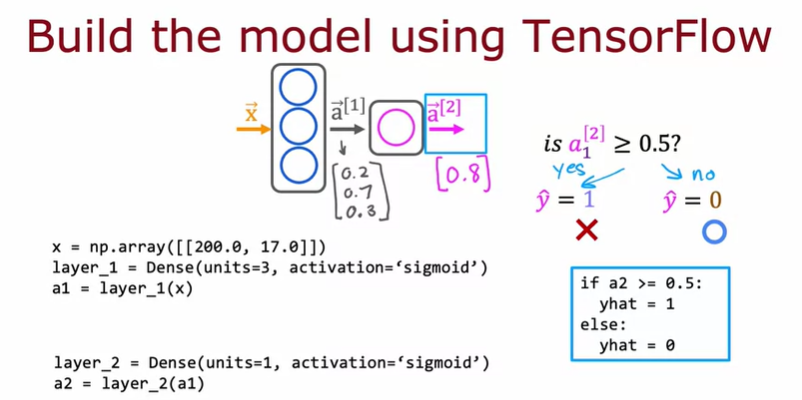  
TensorFlow習慣將numpy傳遞進入的資料改成自己的格式，因此如果希望改回numpy的格式，使用```a1.numpy()```轉換。


#### Data in TensorFlow  
用2D array的方式儲存。
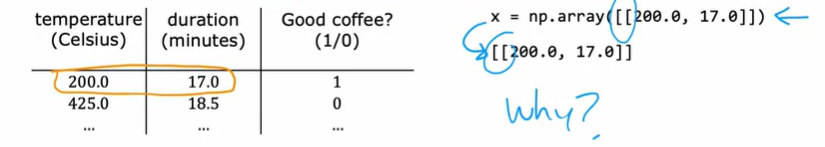

In [7]:
import numpy as np
x1 = np.array([[200,17]]) # one row, two columns(1*2)
x2 = np.array([[200],[17]]) # two row, one columns(2*1)
print("x1:\n",x1)
print("x2:\n",x2)

x =  np.array([200,17]) # 1D vector
print("x:\n",x)

x1:
 [[200  17]]
x2:
 [[200]
 [ 17]]
x:
 [200  17]


處理線性回歸或邏輯回歸時，使用如上方程式變數x的一維向量表示輸入特徵x。  
而在TensorFlow中，慣例使用矩陣表示數據，因為TensorFlow主要是為了處理大量數據，而使用矩陣使TensorFlow在內部提高計算效率。  

In [ ]:
layer_1 = dense(units=3, activation='sigmoid')
a1 = layer_1(x)
a1
a1.numpy()

#### Building a neural network  
定義好第一層與第二層後，取代手動將資料由第一層傳入第二層中，使用TensorFlow中的Sequential函式將第一層與第二層串連在一起。  
``` python
layer_1 = Dense(units=3, activation='sigmoid')
layer_2 = Dense(units=1, activation='sigmoid')
model = Sequential([layer_1, layer_2])
```
通常會改寫成：
``` python
model = Sequential([
    Dense(units=3, activation='sigmoid'), 
    Dense(units=1, activation='sigmoid')])
```
程式架構:  
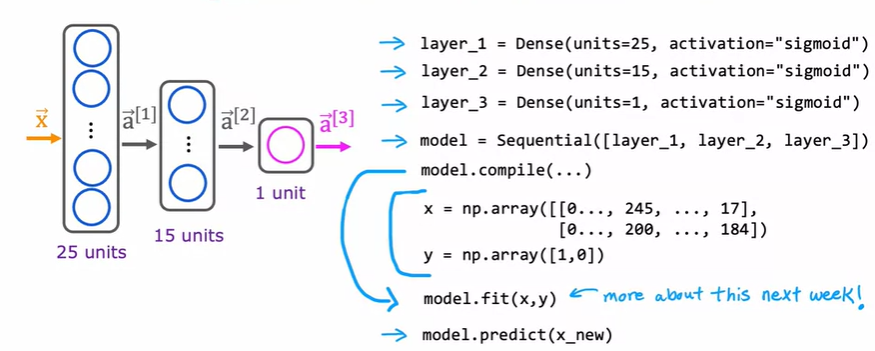


### forward propagation in a single layer  
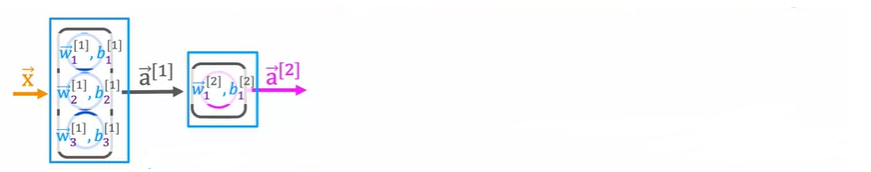  
$\vec{w_1}^{[1]}=\left[
\begin{array}{c}
    1 \\
    2
\end{array}
\right]$　
$\vec{w_2}^{[1]}=\left[
\begin{array}{c}
    -3 \\
    4
\end{array}
\right]$　
$\vec{w_3}^{[1]}=\left[
\begin{array}{c}
    5 \\
    -6
\end{array}
\right]$  
$b_1^{[1]}=-1$　　　$b_2^{[1]}=1$　　　　$b_3^{[1]}=2$

In [ ]:
x = np.array([200,17])

# a_1^{[1]}=g(\vec{w}_1^{[1]}．\vec{x}+b_1^{[1]})
w1_1 = np.array([1,2])
b1_1 = np.array([-1])
z1_1 = np.dot(x1_1,x)+b1_1
a1_1 = sigmoid(z1_1)

# a_2^{[1]}=g(\vec{w}_2^{[1]}．\vec{x}+b_2^{[1]})
w1_2 = np.array([-3,4])
b1_2 = np.array([1])
z1_2 = np.dot(x1_2,x)+b1_2
a1_2 = sigmoid(z1_2)

# a_3^{[1]}=g(\vec{w}_3^{[1]}．\vec{x}+b_3^{[1]})
w1_3 = np.array([5,-6])
b1_3 = np.array([2])
z1_3 = np.dot(x1_3,x)+b1_3
a1_3 = sigmoid(z1_3)

a1 = np.array([a1_1,a1_2,a1_3])

# a_1^{[2]}=g(\vec{w}_1^{[2]}．\vec{a}^{[1]}+b_1^{[2]})
w2_1 = np.array([-7,8,9])
b2_1 = np.array([3])
z2_1 = np.dot(x2_1,a1)+b2_1


In [15]:

W = np.array([
              [1,-3,5],
              [2,4,-6]])
b = np.array([-1,1,2])
a_in = np.array([-2,4])

dense函數的目的是將前一層的激勵值、組合成array的w值(權重)、b參數作為輸入，接著輸出當前層的激勵值，以便傳入下一層。  
<font color="red">※大寫字母代表矩陣，小寫代表向量</font>

In [16]:
def dense(a_in,W,b):
    units = W.shape[1] # :=3, column數
    a_out = np.zeros(units) # 將a設為由0組成的數組，其元素數量與單位數量一樣多 :=[0,0,0]
    for j in range(units): # 由0開始索引
        w = w[:,j] # 拉出矩陣中的第j列, 第一次拉出w1_1, 第二次拉出w1_2
        z = np.dot(w,a_in)+b[j]
        a_out[j] = g(z) # g()定義在dense()外面
    return a_outA

sequential目的是按順序將每層串在一起，以便在神經網路實現前瞻傳播。  
假設有四層，輸入特徵x，接著計算a1到a4，且a4的值等同於輸出值。

In [19]:
def sequential(x):
    a1 = dense(x,W1,b1)
    a2 = dense(a1,W2,b2)
    a3 = dense(a2,W3,b3)
    a4 = dense(a3,W4,b4)
    f_x = a4
    return f_x

#### How neural networks are implemented efficiently  
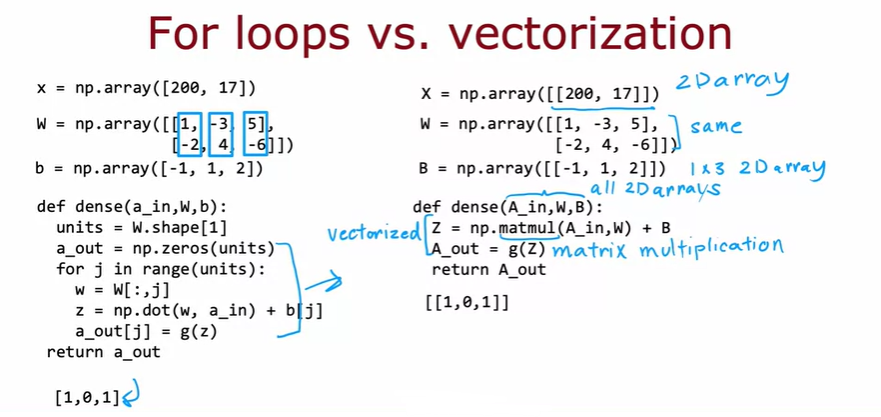

### TensorFlow implementation  

In [26]:
!pip install tensorflow

  Using cached tensorflow-2.16.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.2 kB)
  Using cached absl_py-2.1.0-py3-none-any.whl.metadata (2.3 kB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl.metadata (4.4 kB)
  Using cached flatbuffers-24.3.25-py2.py3-none-any.whl.metadata (850 bytes)
  Using cached gast-0.6.0-py3-none-any.whl.metadata (1.3 kB)
  Using cached google_pasta-0.2.0-py3-none-any.whl.metadata (814 bytes)
  Using cached libclang-18.1.1-py2.py3-none-manylinux2010_x86_64.whl.metadata (5.2 kB)
  Using cached ml_dtypes-0.3.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (20 kB)
  Using cached opt_einsum-3.3.0-py3-none-any.whl.metadata (6.5 kB)
  Using cached termcolor-2.4.0-py3-none-any.whl.metadata (6.1 kB)
  Using cached grpcio-1.64.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.3 kB)
  Using cached tensorboard-2.16.2-py3-none-any.whl.metadata (1.6 kB)
  Using cached keras-3.4.1-py3-none-any.whl

In [23]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

# 第一步:指定模型
model = Sequential([ # 按順序串接三層
    Dense(units=25, activation='sigmoid'),
    Dense(units=15, activation='sigmoid'),
    Dense(units=1, activation='sigmoid'), # 輸出層
])

from tensorflow.keras.losses import BinaryCrossentropy

#第二步:使用特定的損失函數編譯模型，在指定了損失函數後，同時代表定義了訓練神經網路的成本函數
# 讓tensorflow編譯模型需要指定要使用的損失函數
model.compile(loss=BinaryCrossentropy())

#第三步:訓練模型
# 調用fit函式，目的是告訴tensorflow使用上一行中指定的成本函數的損失去將串接的model fit到數據集X、Y中
# epochs指進行梯度下降時要下降幾次
model.fit(X,Y,epochs=100)


ModuleNotFoundError: No module named 'tensorflow'

#### Training Details  
**模型訓練步驟**  
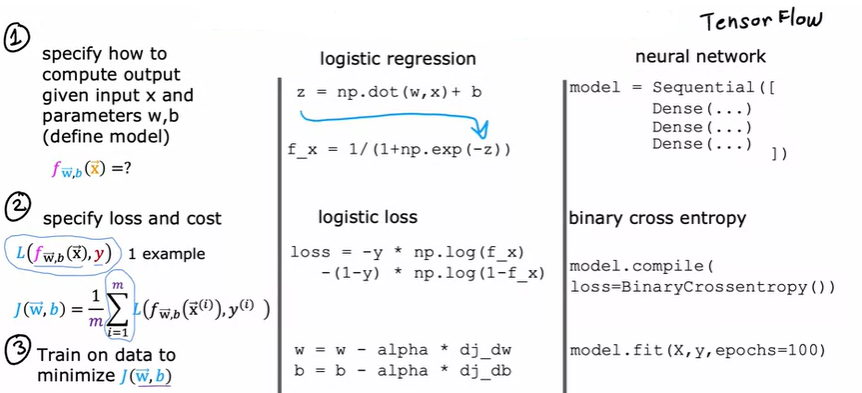  


1. 建立模型
   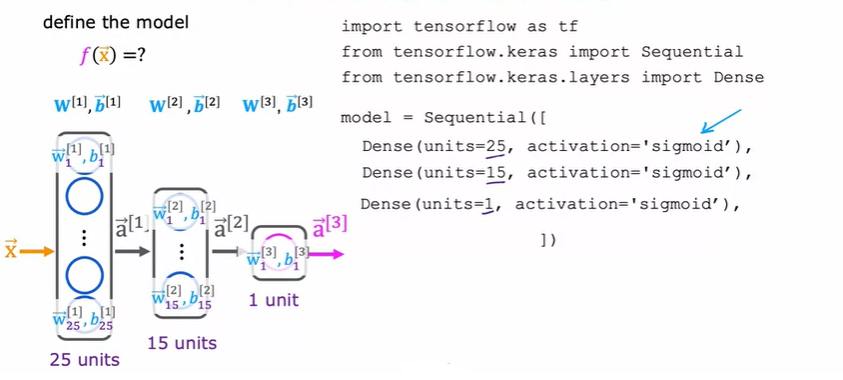

2. 指定損失函數，同時定義了成本函數  
   y:=目標標籤  
   f(x):=神經網路的輸出  
   邏輯回歸的損失函數在tensorflow中也稱，binary cross-entropy loss function。  
   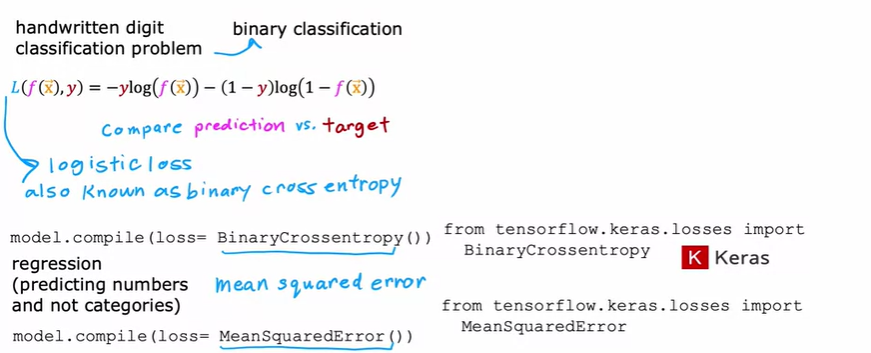
   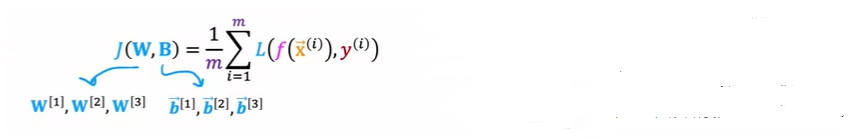
   可自由尋找希望使用的損失函數，例如，為單個訓練指定損失時，使用平方誤差損失函數，取所有(m個)訓練樣本的平均值。

3. 訓練模型 梯度下降  
   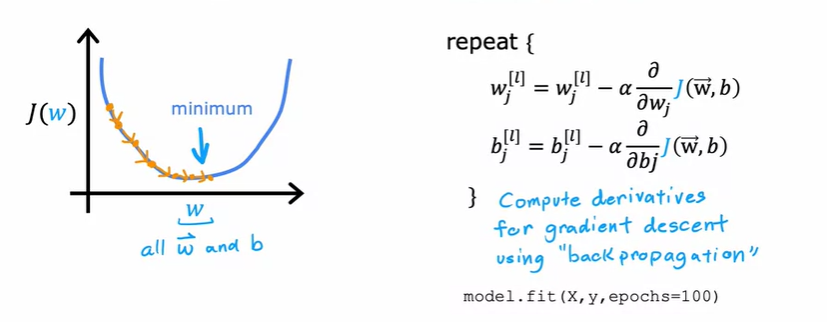

### Alternatives to the sigmoid activation  
以需求預測為例，將awareness完全設為二進值不太合理，因為可能會有中間值存在，因此將awareness設為0到一個非常大的值是更為合理的方式。  
更改激勵函式，將sigmoid函式改成ReLU，使awareness計算出的結果可得到0到無限大的值。  
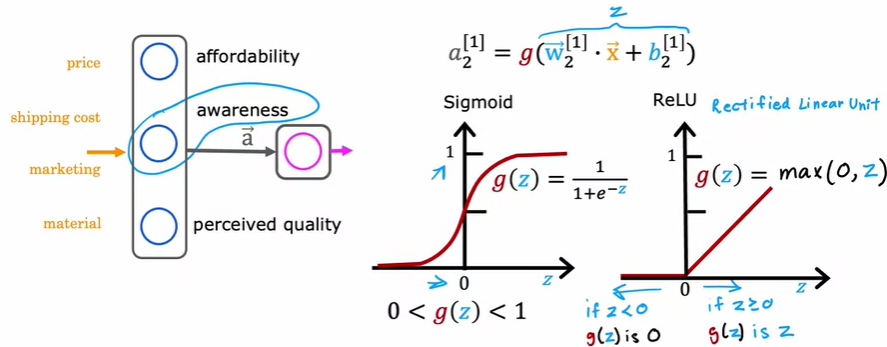  
第三種激勵函數是$g(z)=z$，當使用這種激勵函式時，看器來就像沒有使用任何激勵函式一樣，因為輸入z，輸出也為z。  
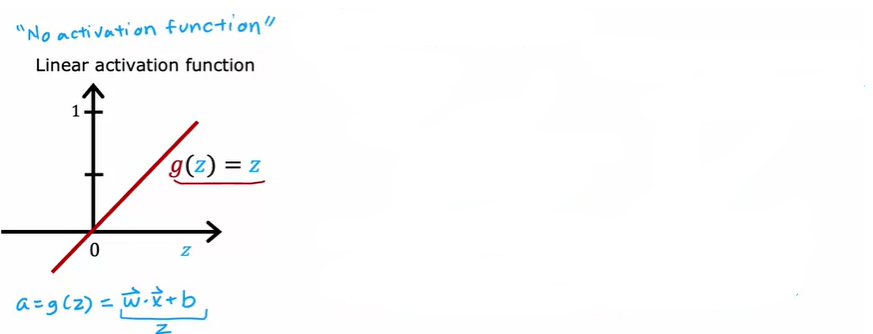  
這三種為最常用的激勵函式，但仍有其他如，softmax的激勵函式。

#### 如何選擇激勵函數?  
根據目標標籤y的不同，**輸出層**的激勵函數也不同。  
假設共有3層，$f(\vec{x})=a_1^{[3]}=g(z^{[3]})$  
* 二元分類問題(Binary classification)，$\hat{y}=0或1$，選擇sigmoid activation function，因為神經網路會預測$\hat{y}=1$的概率。  
* 如果希望解決輸出值可能是正值或是負值的回歸問題(Regression)，例如，今天的股價跟明天股價相比將如何變化，此時可以選擇linear activation function，因為神經網路輸出的$f(\vec{x}) = g(z)$可以取正值或負值輸出。  
* 如果希望解決輸出值只能是正值的回歸問題(Regression)，例如房屋價格，則使用ReLU activation function。  

現今**隱藏層**的激勵函數通常選擇ReLU activation function。  
<!-- ，除非在進行二進制分類問題，在二進制分類問題上則選擇sigmoid activation function。   -->
而早期則較常使用sigmoid activation function。  
因為ReLU速度較快，因為它只需要計算max(0,z)，而sigmoid需要進行指數然後反向計算，因此效率較低；此外第二個原因在於ReLU只在0小於0的部分變平，而sigmoid在+與-軸上都有變平的部分，而在梯度下降時，若有很多地方都是平的，會下降的很慢。  
進行梯度下降運算$\frac{∂}{∂w}J(W,B)$改善$W$時$g(z)$也是計算中的一環。


In [ ]:
# binary classification
from tf.keras.layers import Dense
model = Sequential([
    Dense(units=25, activation='relu'),
    Dense(units=15, activation='relu'),
    Dense(units=1, activation='sigmoid')
    # Dense(units=1, activation='linear')
])

### Multiclass  
不只0跟1的分類問題。  
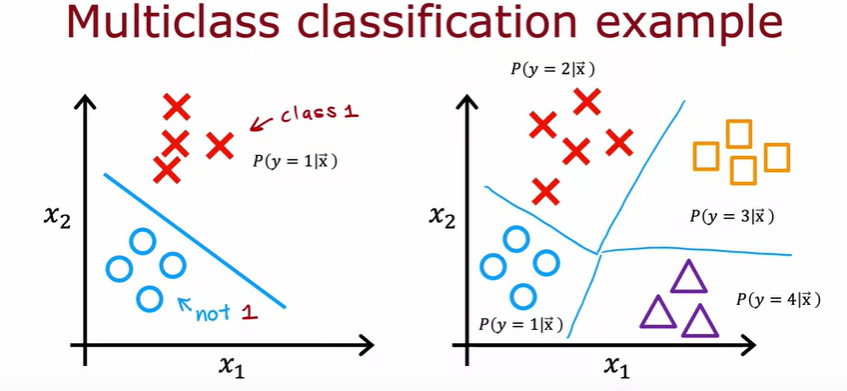

### Softmax regression  

* Logistic regression(2種可能輸出)  
  $z=\vec{w}．\vec{x}+b$  
  $a_1=g(z)=\frac{1}{1+e^{-z}}=P(y=1|\vec{x})$, ex=0.71  
  $a_2=1-a_1=P(y=0|\vec{x})$, ex=0.29  

* Softmax regression(4種可能輸出)  
  \------------------------------------------------------------------------  
  $z_1=\vec{w_1}．\vec{x}+b_1$  
  $a_1=g(z)=\frac{e^{z_1}}{e^{z_1}+e^{z_2}+e^{z_3}+e^{z_4}}=P(y=1|\vec{x})$, ex=0.3  
  $z_2=\vec{w_2}．\vec{x}+b_2$  
  $a_2=g(z)=\frac{e^{z_2}}{e^{z_1}+e^{z_2}+e^{z_3}+e^{z_4}}=P(y=2|\vec{x})$, ex=0.2  
  $z_3=\vec{w_3}．\vec{x}+b_3$  
  $a_3=g(z)=\frac{e^{z_3}}{e^{z_1}+e^{z_2}+e^{z_3}+e^{z_4}}=P(y=3|\vec{x})$, ex=0.15  
  $z_4=\vec{w_4}．\vec{x}+b_4$  
  $a_4=g(z)=\frac{e^{z_4}}{e^{z_1}+e^{z_2}+e^{z_3}+e^{z_4}}=P(y=4|\vec{x})$, ex=0.35  
  \------------------------------------------------------------------------
  $z_j=\vec{w}_j．\vec{x}+b_j　　(j=1,...,N)$  
  $a_j=\frac{e^{z_j}}{\sum_{k=1}^{N}e^{Z_k}}=P(y=j|\vec{x})$  


#### Cost function  
* Logistic regression(2種可能輸出)  
  $loss=-ylog a_1-(1-y)log(1-a_1)$，$a_2=1-a_1$  
  $J(\vec{w},b)$=average loss  
  
* Softmax regression(4種可能輸出)  
  $
loss(a_1,...,a_N,y)=
\left\{
\begin{aligned}
-log(a_1)　& if　y=1 \\
-log(a_2)　& if　y=2 \\
⋮ \\
-log(a_N)　& if　y=N
\end{aligned}
\right.$  
  $a_j$越小，損失越大。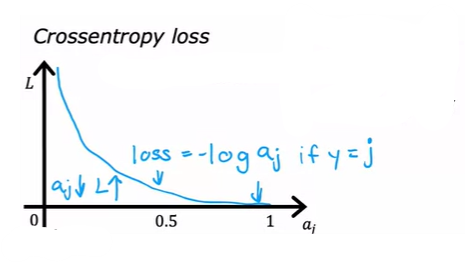


#### Neural Network with Softmax output  
輸出層有10種可能。  
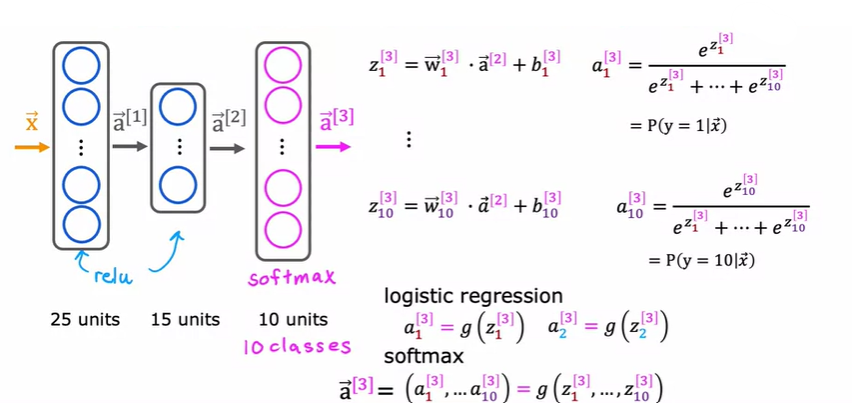

In [ ]:
# MNIST with softmax
# 第一步:指定模型
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
model = Sequential([
    Dense(units=25, activation='relu'),
    Dense(units=15, activation='relu'),
    Dense(units=10, activation='softmax')
])

# 第二步:設定損失函數，稀疏分類損失函數
from tensorflow.keras.losses import SparseCategoricalCrossentropy
model.compile(loss=SparseCategoricalCrossentropy())

# 第三步:訓練模型
model.fit(X,Y,epochs=100)

In [28]:
x1 = 2.0/10000
print(f"{x1:.18f}")

x2 = 1 + (1/10000) - (1 - 1/10000)
print(f"{x2:.18f}")

0.000200000000000000
0.000199999999999978


上方的程式是可以正常運行的，但還可以改進，因為在程式執行時可能會產生捨入誤差，因此可以改進上方程式以減少捨入誤差。  

不使用a作為中間項，直接運算。  
ex1:  
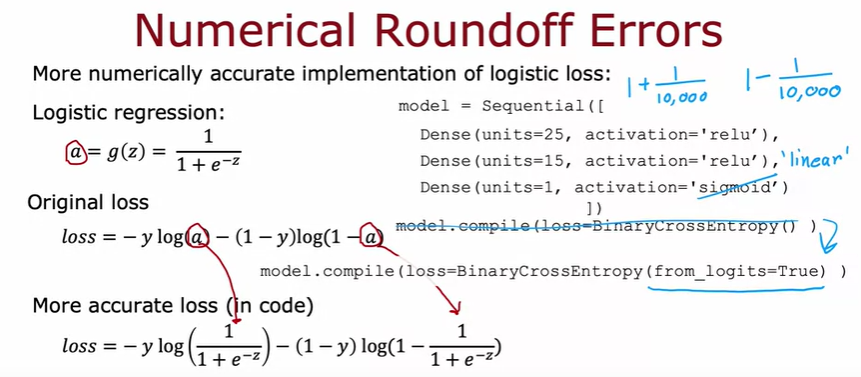  
ex2:  
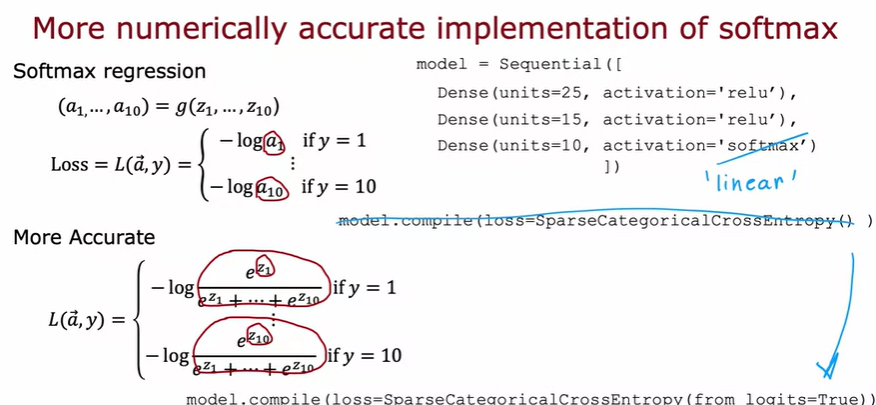

In [ ]:
# 改良後的程式，將輸出的邏輯函數和損失函數結合
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
model = Sequential([
    Dense(units=25, activation='relu'),
    Dense(units=15, activation='relu'),
    Dense(units=10, activation='linear')
])

from tensorflow.keras.losses import SparseCategoricalCrossentropy
model.compile(...,loss=SparseCategoricalCrossentropy(from_logits=True))

model.fit(X,Y,epochs=100)

logits = model(x) # 不再輸出a_1-a_10
f_x = tf.nn.softmax(logits)

In [ ]:
# 對於邏輯回歸，更改成如下以獲得輸出值
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
model = Sequential([
    Dense(units=25, activation='sigmoid'),
    Dense(units=15, activation='sigmoid'),
    Dense(units=1, activation='linear')
])

from tensorflow.keras.losses import BinaryCrossentropy
model.compile(..., BinaryCrossentropy(from_logits=True))

model.fit(X,Y,epochs=100)

logits = model(x)
f_x = tf.nn.sigmoid(logits) # 將其映射到邏輯函數中

### 多標籤分類問題(Classification with multiple outputs)  
不同於多分類問題，標籤y只是一個值，多標籤分類問題中標籤y是多個數字組成的向量。  
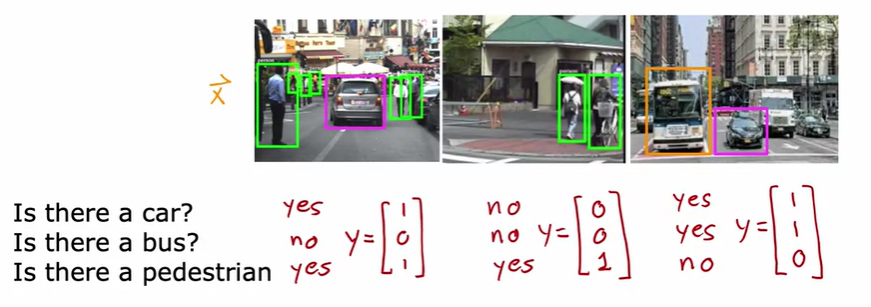  
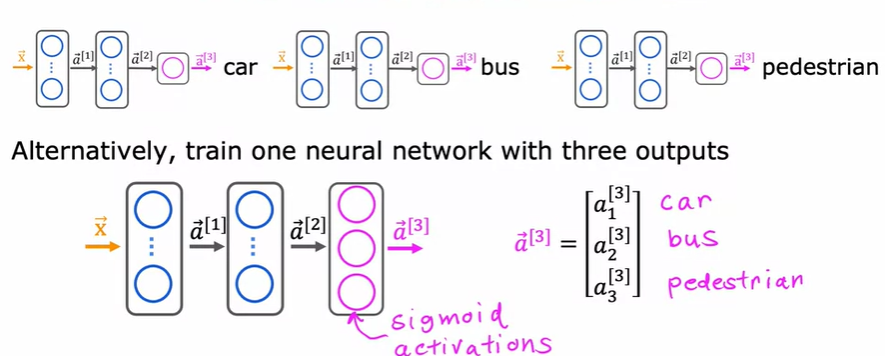

### 最小化成本函數的進階改良方法  
* 梯度下降：  
  >$w_j=w_j-\textcolor{red}{\alpha}\frac{∂}{∂w_j}J(\vec{w},b)　,\alpha=學習率$
  
  "Adam algorithm"發現學習率太小或太大時，會改變學習率以更快找到最小值。
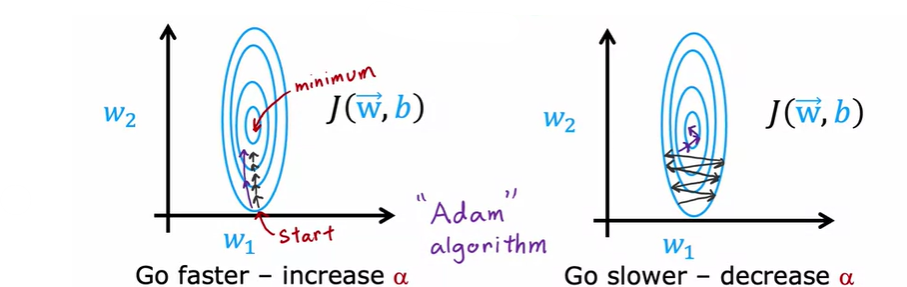
* Adam(<font color="red">Ada</font>ptive <font color="red">M</font>oment estimation) algorithm：  
  不使用單一的$\alpha$，對模型的每個參數都有不同的$\alpha$  
  ex.  
  >$w_j=w_j-\textcolor{red}{\alpha_j}\frac{∂}{∂w_j}J(\vec{w},b)$  
  $b=b-\textcolor{red}{\alpha}\frac{∂}{∂b}J(\vec{w},b)$
  
  * 若$w_j或b$大致朝向相同的方向前進，增加$\textcolor{red}{\alpha_j}$
  * 若$w_j或b$不斷來回震盪，減少$\textcolor{red}{\alpha_j}$

In [ ]:
# 程式展現
model = Sequential([
    tf.keras.layers.Dense(units=25, activation='sigmoid'),
    tf.keras.layers.Dense(units=15, activation='sigmoid'),
    tf.keras.layers.Dense(units=10, activation='linear')
])

# 指定使用Adam優化器，將默認的初始學習率設為0.001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True))

model.fit(X,Y,epochs=100)

# 可替代的層類型  
以往教的神經網路層都是密集層(Dense layer)，每層神經元都從前一層中獲得所有激勵值作為輸入。 儘管使用密集層已經可以建構很強大的算法了，但仍有其他類型的層。 

* 卷積層(Convolutional Layer):  
  * 每個單元只看圖像中的限定像素的位置$\rightarrow$加快計算速度。
  * 需要更少的訓練數據$\rightarrow$不容易出現過度擬和(overfitting)現象。
  * 神經網路中若有多個卷積層，稱為卷積神經網路(Convolutional Neural Network)。
  * 範例：  
    對心臟病進行二進制分類。  
    心電圖(ECG)，一維輸入(高度)，$x_1$\~$x_{100}$記錄了高度，第一層隱藏層中的神經元不需要輸入$\vec{x}$中的所有100個值，他只會注意$x_1$\~$x_{20}$，第二個神經元只會注意$x_11$\~$x_{30}$...，在這層中共有9個神經元。  
    若第二層隱藏層也為卷積層，第二層卷積層中的神經元不會輸入所有由第一層神經元計算得到的激活值，而只會輸入部分希望他關注的激活值。  
    最後由sigmoid function計算後輸出分類後的結果。  
    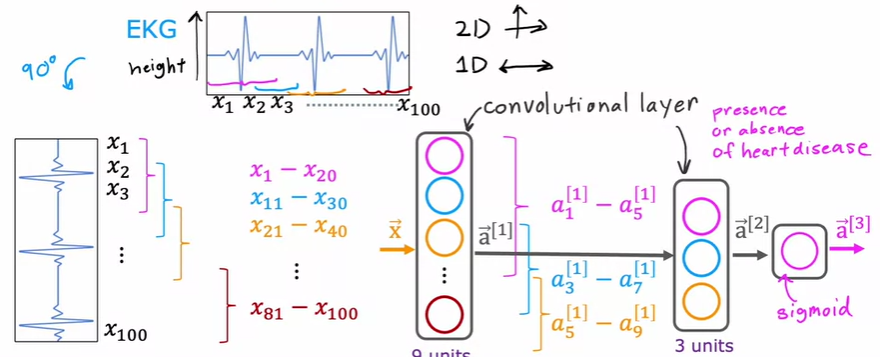

### 幫助建構機器學習的建議  
實行正則化線性回歸時，在預測時出現不可預測的錯誤，下一步該做甚麼?  
* 獲取更多訓練範例
* 減少特徵
* 增加特徵
* 增加多項式複雜度
* 減少$\lambda$
* 增加$\lambda$

### 評估模型的性能  
將資料分成7(訓練集):3(測試集)，在下標上加上train與test區分。  
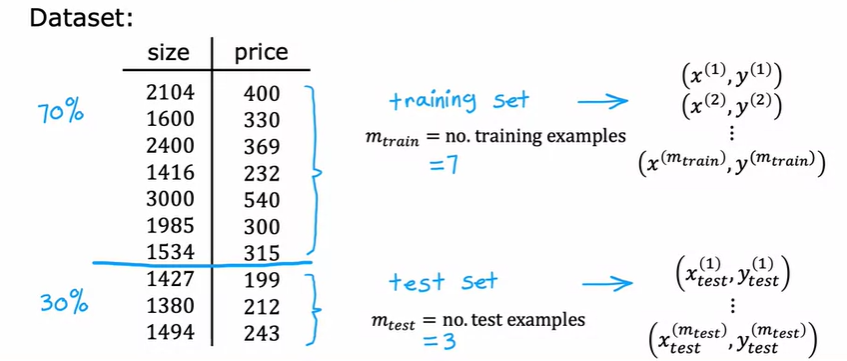  
* 線性回歸(平方成本函數)  
最小化成本函數$J(\vec{w},b)$  
$\rightarrow J(\vec{w},b)=[\frac{1}{2m_{train}}\sum\limits_{i=1}^{m_{train}}
(f_{\vec{w},b}(\vec{x}^{(i)})-y^{(i)})^2+\textcolor{red}{\frac{\lambda}{2m_{train}}\sum\limits_{j=1}^{n}w^2_j}]
$  
計算測試誤差:  
$\rightarrow J_{test}(\vec{w},b)=[\frac{1}{2m_{test}}\sum\limits_{i=1}^{m_{test}}
(f_{\vec{w},b}(\vec{x}^{(i)}_{test})-y^{(i)}_{test})^2]
$  
計算訓練誤差:  
$\rightarrow J_{train}(\vec{w},b)=[\frac{1}{2m_{train}}\sum\limits_{i=1}^{m_{train}}
(f_{\vec{w},b}(\vec{x}^{(i)}_{train})-y^{(i)}_{train})^2]
$

* 分類問題
  * 使用邏輯損失計算誤差  
最小化成本函數$J(\vec{w},b)$  
$\rightarrow J(\vec{w},b)=-\frac{1}{m_{train}}\sum\limits_{i=1}^{m_{train}}
[y^{(i)}log(f_{\vec{w},b}(\vec{x}^{(i)}))+(1-y^{(i)})log(1-f_{\vec{w},b}(\vec{x}^{(i)}))]+\textcolor{red}{\frac{\lambda}{2m_{train}}\sum\limits_{j=1}^{n}w^2_j}
$  
計算測試誤差:  
$\rightarrow J_{test}(\vec{w},b)=-\frac{1}{m_{test}}\sum\limits_{i=1}^{m_{test}}
[y^{(i)}_{test}log(f_{\vec{w},b}(\vec{x}^{(i)}_{test}))+(1-y^{(i)}_{test})log(1-f_{\vec{w},b}(\vec{x}^{(i)}_{test}))]
$  
計算訓練誤差:  
$\rightarrow J_{train}(\vec{w},b)=-\frac{1}{m_{train}}\sum\limits_{i=1}^{m_{train}}
[y^{(i)}_{train}log(f_{\vec{w},b}(\vec{x}^{(i)}_{train}))+(1-y^{(i)}_{train})log(1-f_{\vec{w},b}(\vec{x}^{(i)}_{train}))]
$
  * 使用訓練結果計算誤差比例  
$
\hat{y}=
\left\{
\begin{aligned}
1　if　f_{\vec{w},b}(\vec{x}^{(i)})\geq0.5 \\
0　if　f_{\vec{w},b}(\vec{x}^{(i)})<0.5
\end{aligned}
\right.$  
count $\hat{y}\neq y$  
$J_{test}(\vec{w},b)$ 是測試集中被錯誤分類的部分，佔總測試集的一部分。  
$J_{train}(\vec{w},b)$ 是訓練集中被錯誤分類的部分，佔總訓練集的一部分。

線性回歸中，當過擬和時，訓練集誤差幾乎為0，測試集誤差則非常高。
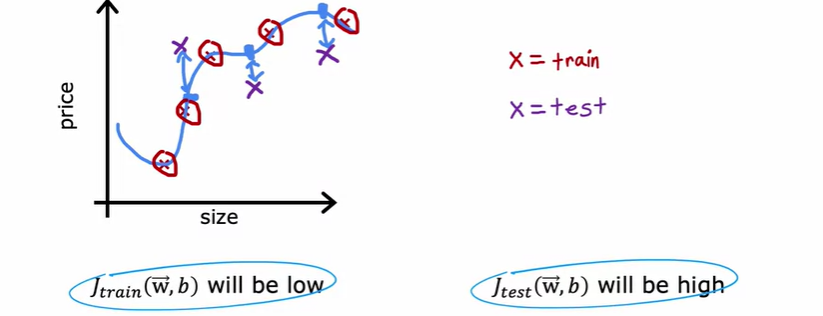  
$d=1　f_{\vec{w},b}=w_1x+b \rightarrow w^{<1>},b^{<1>} \rightarrow J_{test}(w^{<1>},b^{<1>})$  
$d=2　f_{\vec{w},b}=w_1x+w_2x^2+b \rightarrow w^{<2>},b^{<2>} \rightarrow J_{test}(w^{<2>},b^{<2>})$  
$d=3　f_{\vec{w},b}=w_1x+w_2x^2+w_3x^3+b \rightarrow w^{<3>},b^{<3>} \rightarrow J_{test}(w^{<3>},b^{<3>})$  
...  
$d=10　f_{\vec{w},b}=w_1x+w_2x^2+...+w_{10}x^{10}+b \rightarrow J_{test}(w^{<10>},b^{<10>})$

在計算1到10階多項式測試集的誤差時，有可能會發現在計算$J_{test}(w^{<5>},b^{<5>})$是最低的($d=5$)，但這不表示選擇五階多項式是最好的選擇。  
因為$J_{test}(w^{<5>},b^{<5>})$計算出的test set error可能是對於generailzation($J_{test}(w^{<5>},b^{<5>})$\<generalization error>)的樂觀估計。
因為計算test set error時，多了一個額外的參數$d$(:=degree of polynomial)。  
<font color="red">※如果將w，b擬合到訓練數據中，訓練數據將會過於樂觀的估計誤差。</font>  

若想自動選擇模型，ex.決定要選擇d等於多少的多項式，以下是修改的方法，幫助測試程序去進行模型選擇。  
將數據拆分成三個子集，訓練集、交叉驗證集、測試集。

### Model selection  
#### training/cross validation/test sets  
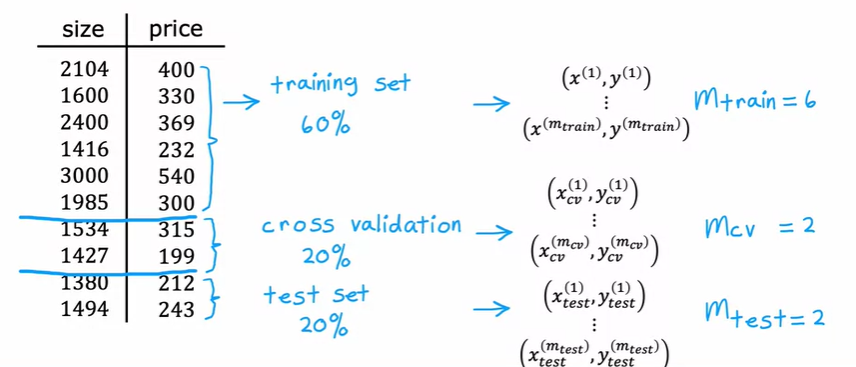  
計算誤差的公式中都不包含訓練時的正則化項。  
* Training error: $J_{train}(\vec{w},b)=\frac{1}{2m_{train}}[\sum\limits_{i=1}^{m_{train}}(f_{\vec{w},b}(\vec{x}^{(i)})-y^{(i)})^2]$
* Cross validation error: $J_{cv}(\vec{w},b)=\frac{1}{2m_{cv}}[\sum\limits_{i=1}^{m_{cv}}(f_{\vec{w},b}(\vec{x}_{cv}^{(i)})-y_{cv}^{(i)})^2]$  
  也稱validation error, dev error。
* Test error: $J_{test}(\vec{w},b)=\frac{1}{2m_{test}}[\sum\limits_{i=1}^{m_{test}}(f_{\vec{w},b}(\vec{x}_{test}^{(i)})-y_{test}^{(i)})^2]$

用這三種衡量標準進行模型選擇，$d=1$~$10$，擬和參數$w、b$，計算交叉驗證集的誤差，選擇具有最低誤差的模型。  
$d=1　f_{\vec{w},b}=w_1x+b \rightarrow w^{<1>},b^{<1>} \rightarrow J_{cv}(w^{<1>},b^{<1>})$  
$d=2　f_{\vec{w},b}=w_1x+w_2x^2+b \rightarrow w^{<2>},b^{<2>} \rightarrow J_{cv}(w^{<2>},b^{<2>})$  
$d=3　f_{\vec{w},b}=w_1x+w_2x^2+w_3x^3+b \rightarrow w^{<3>},b^{<3>} \rightarrow J_{cv}(w^{<3>},b^{<3>})$  
...  
$d=10　f_{\vec{w},b}=w_1x+w_2x^2+...+w_{10}x^{10}+b \rightarrow J_{cv}(w^{<10>},b^{<10>})$  
假設$J_{cv}(w^{<4>},b^{<4>})$最低，選擇$d=4$作為模型。  
如果想測試這個模型在新數據上表現的誤差，則計算$J_{test}(w^{<4>},b^{<4>})$  

用訓練集擬和參數，使用交叉驗證集選擇多項式$d$的值，最後公平的使用測試集估計此模型的誤差(generalization error)，因為目前為止，還沒將$w、b、d$擬和到測試集中。



ex.從以下三個架構中擇一：  
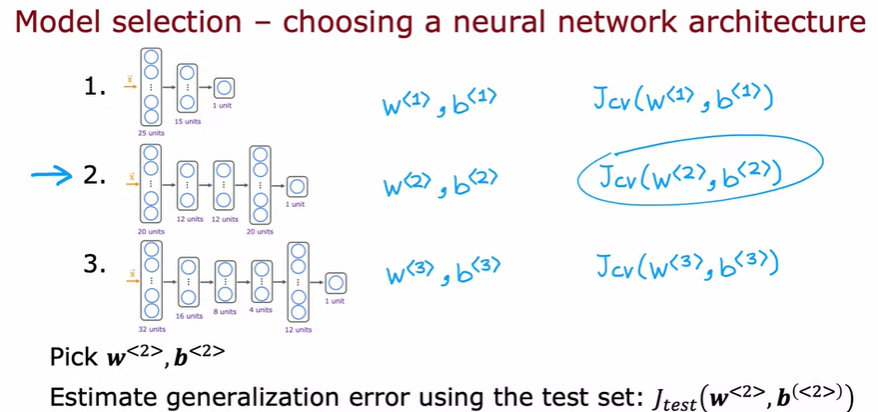  
訓練所有模型，得到第一個模型的參數$w^{<1>},b^{<1>}$、第二個模型的參數$w^{<2>},b^{<2>}$、第三個模型的參數$w^{<3>},b^{<3>}$，最後使用交叉驗證集來評估模型的效能，如果是分類問題，可以直接用$\hat{y}\neq y$計算正確比例。  
最後選擇使用交叉驗證集計算出誤差最低的模型，決定最終模型後，若想計算generalization error的估計值，再使用測試集去計算，如此才能確保模型應用在新數據上的結果是正確，沒被樂觀估計的。  


### Diagnosing bias and variance  
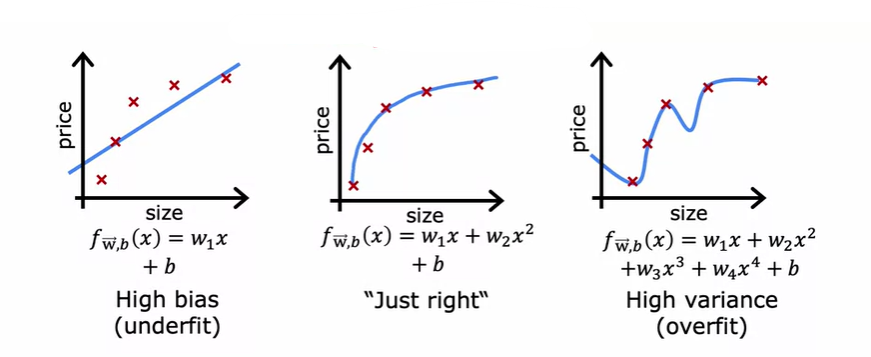  

單個特徵$x$時可以繪製函數f檢查，但當特徵數量變多時就無法這樣繪製f用圖片可視化他的表現情況。  
因此透過算法在訓練集與交叉驗證集上的表現去判斷是高偏差或是過擬和為更好的方式。  

左邊第一張圖，算法上$J_{train}$很高，且對於之前沒訓練過的資料而言，$J_{cv}$也很高。  
中間的圖，算法上$J_{train}$很低，且對於之前沒訓練過的資料而言，$J_{cv}$也很低。  
右邊的圖，算法上$J_{train}$很低，但對於之前沒訓練過的資料而言，$J_{cv}$很高。  
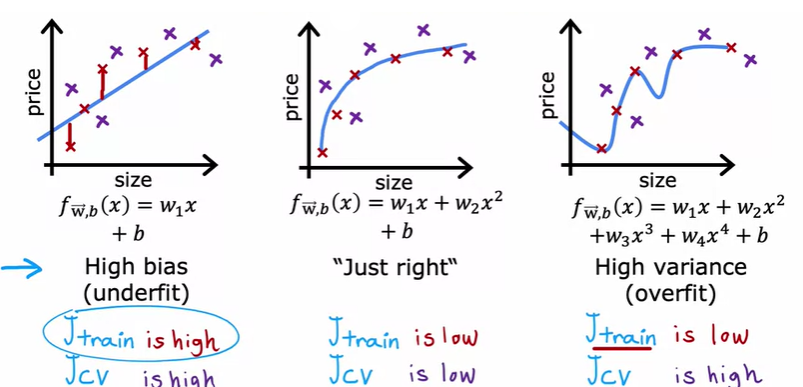

**$J_{train}$、$J_{cv}$如何隨多項式(d)的變化而改變**  
假設沒有使用正則化，當擬和更高階的多項式時，訓練誤差通常會下降，因此$J_{train}$通常會向下移動。  
而$J_{cv}$不論在維度過高或過低時的表現通常都不佳，反而在介於過高與過低之間的維度上表現的最好。  
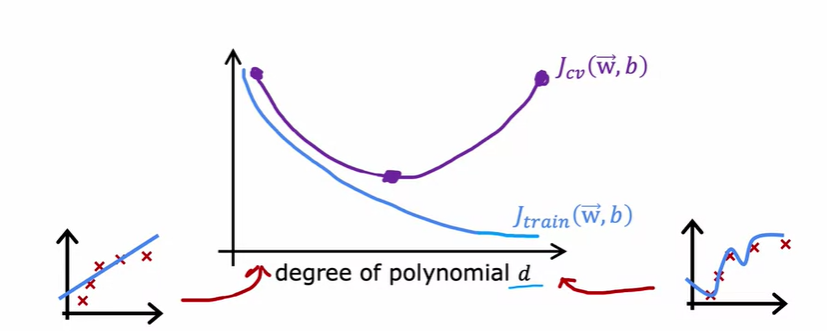  
雖然不常出現，但可能同時存在高偏差與高擬和，特徵是$J_{train}$很高，且同時交叉驗證誤差遠大於訓練集誤差，可以想像成，他過度擬和了部分輸入，但對於其他輸入卻有非常高的誤差。
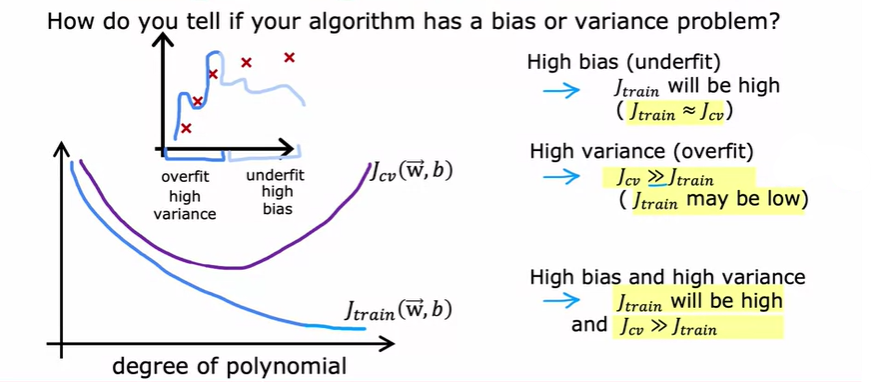  

總而言之，高偏差指在訓練集上表現不佳，高擬和指在交叉驗證集上表現不佳。  
※在訓練機器學習算法時，建議可以先弄清楚使用的算法在什麼程度上存在高偏差和高擬和。

**正則化(Regularization)中$\lambda$的選擇如何影響偏差(underfit)與方差(overfit)**  
以線性回歸為例，以正則化擬和下方模型。  
Model:$f_{\vec{w},b}(x)=w_1x+w_2x^2+w_3x^3+w_4x^4+b$  
$J(\vec{w},b)=\frac{1}{2m}\sum\limits_{i=1}^{m}
(f_{\vec{w},b}(\vec{x}^{(i)})-y^{(i)})^2+\textcolor{red}{\frac{\lambda}{2m}\sum\limits_{j=1}^{n}w^2_j}
$  
$\lambda$的值是正則化參數，在保持較小的值與適當的去擬和訓練數據之間權衡。  

* 將$\lambda$設為一個很大的值：  
  ex.$\lambda=10000$  
  $w_1、w_2、w_3、w_4\approx0$，得到的圖會趨於直線，即$f_{\vec{w},b}(\vec{x})\approx b\rightarrow$underfit。
* 將$\lambda$設為一個很小的值：  
  ex.$\lambda=0$  
  $w_1、w_2、w_3、w_4$都不會有任何改變，得到的圖會等於最初過於擬和數據的曲線$\rightarrow$overfit。
* 將$\lambda$設為中間值：  
  ex.$0<\lambda<10000\rightarrow$just right。
  
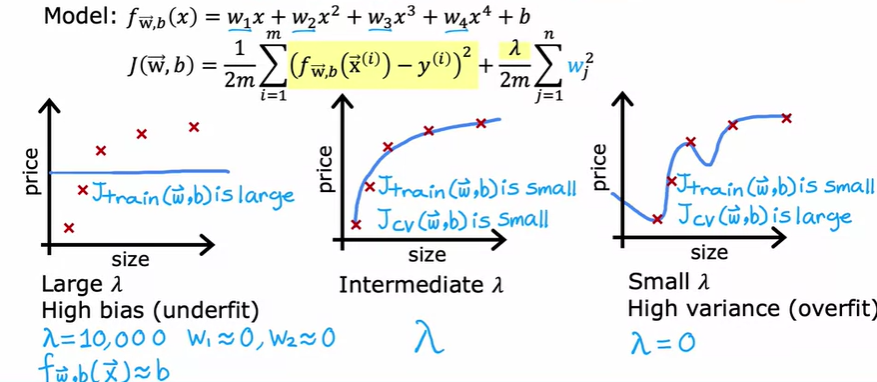

**選擇正則化參數$\lambda$**  
依序選擇$\lambda$後帶入計算$\vec{w},b$，得到最小化參數$w^{<1>},b^{<1>}$，再計算$J_{cv}(w^{<1>},b^{<1>})$，最後選擇交叉驗證集中具有最小值的$\lambda$(假設是<5>，$\lambda=0.08$)，及其參數$w^{<5>},b^{<5>}$，再計算測試集誤差的估計值$J_{test}(w^{<5>},b^{<5>})$。  
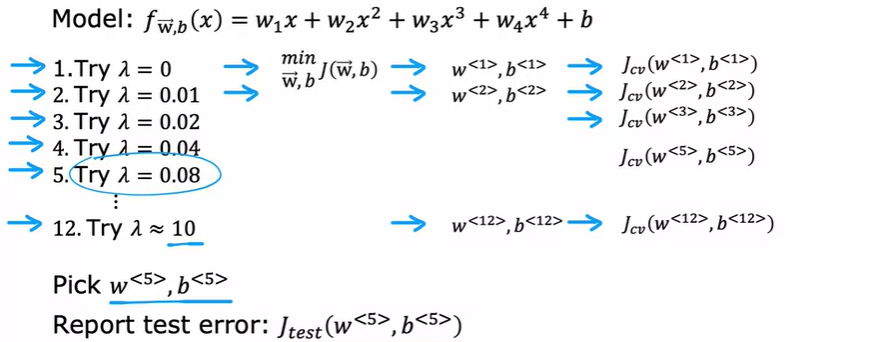

**$J_{train}$、$J_{cv}$如何隨$\lambda$的變化而改變**  
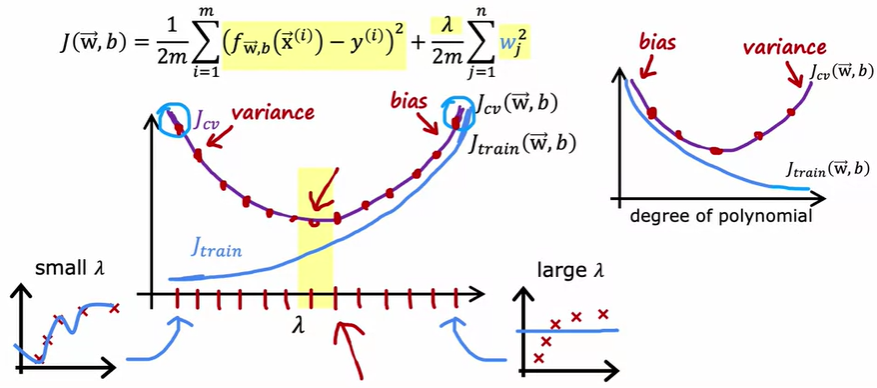

### 建立表現基準水平(baseline level)的方法
若沒有基準線作為參照值，則可能對訓練出的模型有不正確的認知。  
* 人類在這項任務的表現
* 比較競爭的演算，這可能是以前過現在的算法
* 根據以往的經驗來猜測

若基準線跟訓練誤差兩者差距很大，$\rightarrow$高偏差  
若訓練誤差跟交叉驗證誤差兩者差距很大，$\rightarrow$高方差(variance)  
ex1:
> Training error $J_{train}$:10.8%  
> 當只看到誤差10.8%時可能會覺得誤差很高，認為這個模型存在高偏差的問題，但如果加入人類對這些訓練數據的測試結果，發現人類的誤差達到10.6%時，此時有了一個比較的基準值，兩者只差距0.2%，可知這個模型並沒有高偏差的問題。
> 對於交叉驗證集的誤差，模型的誤差是:14.8%，交叉驗證誤差與訓練誤差差距4%，為一個偏高的數字，因此可知存在高方差的問題。

ex2:
> 基準水平:10.6%  
> 訓練誤差:15.0%  
> 交叉驗證誤差:15.5%  
> 因為基準水平和訓練誤差差距過大，但訓練誤差與交叉驗證誤差間的差距小，因此這個例子中的模型具有高偏差的問題。

ex3:
> 基準水平:10.6%  
> 訓練誤差:15.0%  
> 交叉驗證誤差:19.9%  
> 因為基準水平和訓練誤差差距過大，訓練誤差與交叉驗證誤差間的差距也過大，因此這個例子中的模型同時具有高偏差與高方差的問題。

### 學習曲線(Learning curves)  
學習算法的表現取決於他所擁有的訓練數據多寡，學習曲線幫助理解這件事。  
擬和二階多項式模型($f_{\vec{w},b}(x)=w_1x+w_2x^2+b$)的學習曲線：  

隨著訓練集的變大，事實上，訓練集的誤差會變大，因為如右邊的小圖幾張小圖為例，當訓練集變多時，會發現畫出的曲線更難擬和訓練集中的所有數據。  
在學習曲線中交叉驗證誤差通常會高於訓練誤差，因為擬和參數的過程中會用到訓練集，因此訓練集的表現會比交叉驗證集表現的更好。
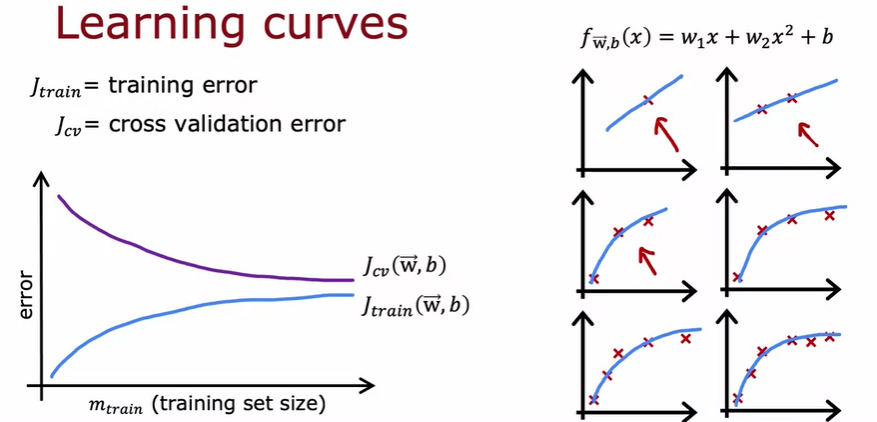


**高偏差與高方差的學習曲線**  
* 高偏差：  
  最初隨著$m$的上升，訓練集的誤差快速上升，但過一陣子後誤差會趨於平緩，因為雖然得到的訓練樣本變多，但因為模型沒有發生改變，因此平均訓練誤差也不會改變。  
  同樣，交叉驗證誤差最初會快速下降，之後趨於平緩，且無論$x$軸向黃色部分延伸多長(訓練集有多大)，$J{train}、J{cv}$都會保持平坦。  
  對比基準值(人類表現)，會發現基準值遠低於$J{train}$。  
  <font color="red">※結論：若模型存在高偏差，那麼即使獲得更多訓練數據也不會有希望改變高偏差的現況。</font>  
  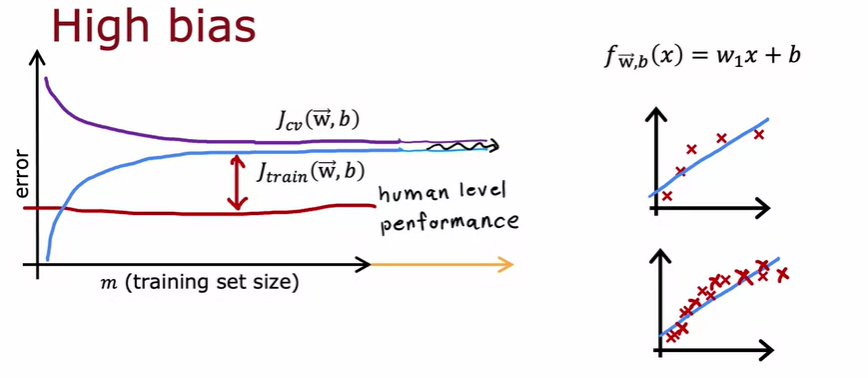

* 高方差：  
  最初隨著$m$的上升，訓練集的誤差上升；交叉驗證誤差會隨著訓練集的增加微微下降，但交叉驗證誤差還是遠高於訓練誤差。  
  對比基準值，會發現在高方差的情況下$J{train}$會非常接近基準值，且有時候甚至會低於基準值。  
  但在高方差的情況下若訓練集變大，$m$值增加，$J{train}、J{cv}$會向基準值接近，因此可以改善高方差的問題，讓算法表現的更好。  
  <font color="red">※結論：若模型存在高方差，那麼獲得更多訓練數據可能會對於改善算法有所幫助。</font>  
  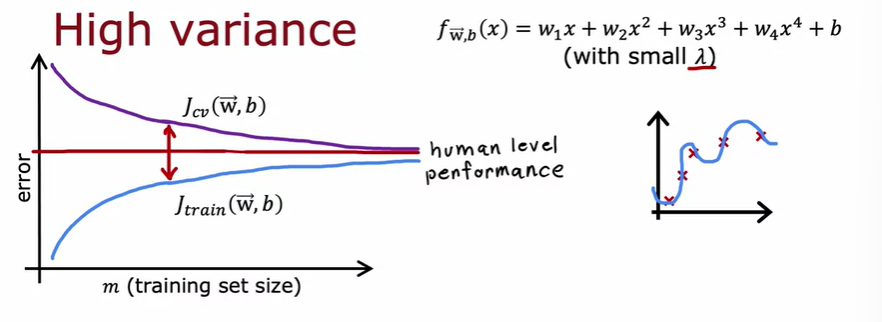

In [ ]:
Regularization and bias/variance